In [1]:
# Generic inputs for most ML tasks
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor

pd.options.display.float_format = '{:,.2f}'.format

# setup interactive notebook mode
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from IPython.core.display import display, HTML

/var/folders/tl/lnf2sv191t77b2f4hhxqlcx80000gn/T/ipykernel_88141/2665750577.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
/var/folders/tl/lnf2sv191t77b2f4hhxqlcx80000gn/T/ipykernel_88141/2665750577.py:17: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
# fetch data 

# flight_dataset = pd.read_csv('flight_dataset-merged.csv')
flight_dataset = pd.read_csv('../dataset/merged_data/merged_flight_weather_hourly_jan2022_dec2023.csv')

flight_dataset.head()
len(flight_dataset)

,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,ARR_TIME,ARR_DELAY,CANCELLED,DIVERTED,...,DEST_WTH_precipprob,DEST_WTH_preciptype,DEST_WTH_snow,DEST_WTH_windgust,DEST_WTH_windspeed,DEST_WTH_winddir,DEST_WTH_cloudcover,DEST_WTH_visibility,DEST_WTH_severerisk,DEST_WTH_conditions
0,1,AA,MQ,4134,ORD,SYR,"1,257.00",-19.00,0,0,...,0,NaN,0.00,NaN,6.90,309.00,84.30,9.90,NaN,Partially cloudy
1,1,AA,MQ,4253,ORD,SYR,"2,024.00",12.00,0,0,...,0,NaN,0.00,NaN,5.80,335.00,29.60,9.90,NaN,Partially cloudy
2,1,AA,MQ,4316,ORD,SYR,"1,813.00",-2.00,0,0,...,0,NaN,0.00,NaN,5.70,292.00,47.30,9.90,NaN,Partially cloudy
3,1,UA,G7,4576,ORD,SYR,"1,722.00",-14.00,0,0,...,0,NaN,0.00,NaN,5.70,292.00,47.30,9.90,NaN,Partially cloudy
4,1,B6,B6,116,JFK,SYR,NaN,NaN,1,0,...,0,NaN,0.00,NaN,6.80,301.00,84.30,9.90,NaN,Partially cloudy


6969

In [3]:
# Columns used in our dataset
flight_dataset.columns

Index(['DAY_OF_WEEK', 'MKT_UNIQUE_CARRIER', 'OP_UNIQUE_CARRIER',
       'OP_CARRIER_FL_NUM', 'ORIGIN', 'DEST', 'ARR_TIME', 'ARR_DELAY',
       'CANCELLED', 'DIVERTED', 'DUP', 'DISTANCE', 'WEATHER_DELAY',
       'NAS_DELAY', 'LATE_AIRCRAFT_DELAY', 'DIV_AIRPORT_LANDINGS',
       'CRS_ELAPSED_TIME', 'SCH_DEP_TIME', 'SCH_ARR_TIME', 'ORGIN_WTH_temp',
       'ORGIN_WTH_feelslike', 'ORGIN_WTH_precip', 'ORGIN_WTH_precipprob',
       'ORGIN_WTH_preciptype', 'ORGIN_WTH_snow', 'ORGIN_WTH_windgust',
       'ORGIN_WTH_windspeed', 'ORGIN_WTH_winddir', 'ORGIN_WTH_cloudcover',
       'ORGIN_WTH_visibility', 'ORGIN_WTH_severerisk', 'ORGIN_WTH_conditions',
       'DEST_WTH_temp', 'DEST_WTH_feelslike', 'DEST_WTH_precip',
       'DEST_WTH_precipprob', 'DEST_WTH_preciptype', 'DEST_WTH_snow',
       'DEST_WTH_windgust', 'DEST_WTH_windspeed', 'DEST_WTH_winddir',
       'DEST_WTH_cloudcover', 'DEST_WTH_visibility', 'DEST_WTH_severerisk',
       'DEST_WTH_conditions'],
      dtype='object')

In [4]:
flight_dataset.dtypes

DAY_OF_WEEK               int64
MKT_UNIQUE_CARRIER       object
OP_UNIQUE_CARRIER        object
OP_CARRIER_FL_NUM         int64
ORIGIN                   object
DEST                     object
ARR_TIME                float64
ARR_DELAY               float64
CANCELLED                 int64
DIVERTED                  int64
DUP                      object
DISTANCE                  int64
WEATHER_DELAY           float64
NAS_DELAY               float64
LATE_AIRCRAFT_DELAY     float64
DIV_AIRPORT_LANDINGS      int64
CRS_ELAPSED_TIME        float64
SCH_DEP_TIME             object
SCH_ARR_TIME             object
ORGIN_WTH_temp          float64
ORGIN_WTH_feelslike     float64
ORGIN_WTH_precip        float64
ORGIN_WTH_precipprob      int64
ORGIN_WTH_preciptype     object
ORGIN_WTH_snow          float64
ORGIN_WTH_windgust      float64
ORGIN_WTH_windspeed     float64
ORGIN_WTH_winddir       float64
ORGIN_WTH_cloudcover    float64
ORGIN_WTH_visibility    float64
ORGIN_WTH_severerisk    float64
ORGIN_WT

In [5]:
unique_carriers = flight_dataset['MKT_UNIQUE_CARRIER'].unique()
print("Unique values of MKT_UNIQUE_CARRIER:")
for carrier in unique_carriers:
    print(carrier)
    
unique_op_carriers = flight_dataset['OP_UNIQUE_CARRIER'].unique()
print("\nUnique values of OP_UNIQUE_CARRIER:")
for carrier in unique_op_carriers:
    print(carrier)

unique_origins = flight_dataset['ORIGIN'].unique()
print("\nUnique values of ORIGIN:")
for origin in unique_origins:
    print(origin)

unique_destinations = flight_dataset['DEST'].unique()
print("\nUnique values of DEST:")
for destination in unique_destinations:
    print(destination)

Unique values of MKT_UNIQUE_CARRIER:
AA
UA
B6
DL
WN

Unique values of OP_UNIQUE_CARRIER:
MQ
G7
B6
9E
OO
PT
WN
UA
YX
ZW

Unique values of ORIGIN:
ORD
JFK
MCO

Unique values of DEST:
SYR


In [6]:
#Check for NaN values
flight_dataset.isna().sum()
total_nan_count = flight_dataset.isna().sum().sum()
print("Total NaN values in the DataFrame:", total_nan_count)

nan_columns = flight_dataset.columns[flight_dataset.isna().any()].tolist()

for col in nan_columns:
    nan_count = flight_dataset[col].isna().sum()
    print(f"Column '{col}' has {nan_count} NaN values.")

DAY_OF_WEEK                0
MKT_UNIQUE_CARRIER         0
OP_UNIQUE_CARRIER          0
OP_CARRIER_FL_NUM          0
ORIGIN                     0
DEST                       0
ARR_TIME                 188
ARR_DELAY                196
CANCELLED                  0
DIVERTED                   0
DUP                        0
DISTANCE                   0
WEATHER_DELAY           5405
NAS_DELAY               5405
LATE_AIRCRAFT_DELAY     5405
DIV_AIRPORT_LANDINGS       0
CRS_ELAPSED_TIME        1717
SCH_DEP_TIME               0
SCH_ARR_TIME               0
ORGIN_WTH_temp             0
ORGIN_WTH_feelslike        0
ORGIN_WTH_precip           0
ORGIN_WTH_precipprob       0
ORGIN_WTH_preciptype    6082
ORGIN_WTH_snow             0
ORGIN_WTH_windgust        35
ORGIN_WTH_windspeed        0
ORGIN_WTH_winddir          0
ORGIN_WTH_cloudcover       0
ORGIN_WTH_visibility       0
ORGIN_WTH_severerisk      91
ORGIN_WTH_conditions       0
DEST_WTH_temp              0
DEST_WTH_feelslike         0
DEST_WTH_preci

Total NaN values in the DataFrame: 30416
Column 'ARR_TIME' has 188 NaN values.
Column 'ARR_DELAY' has 196 NaN values.
Column 'WEATHER_DELAY' has 5405 NaN values.
Column 'NAS_DELAY' has 5405 NaN values.
Column 'LATE_AIRCRAFT_DELAY' has 5405 NaN values.
Column 'CRS_ELAPSED_TIME' has 1717 NaN values.
Column 'ORGIN_WTH_preciptype' has 6082 NaN values.
Column 'ORGIN_WTH_windgust' has 35 NaN values.
Column 'ORGIN_WTH_severerisk' has 91 NaN values.
Column 'DEST_WTH_preciptype' has 5732 NaN values.
Column 'DEST_WTH_windgust' has 65 NaN values.
Column 'DEST_WTH_severerisk' has 95 NaN values.


In [7]:
#Check the categorical and non-categorical columns
categorical_columns = flight_dataset.select_dtypes(include=['object', 'category']).columns.tolist()
non_categorical_columns = flight_dataset.select_dtypes(exclude=['object', 'category']).columns.tolist()

print("Categorical Columns:")
for col in categorical_columns:
    print("- ", col)

print("\nNon-Categorical Columns:")
for col in non_categorical_columns:
    print("- ", col)

Categorical Columns:
-  MKT_UNIQUE_CARRIER
-  OP_UNIQUE_CARRIER
-  ORIGIN
-  DEST
-  DUP
-  SCH_DEP_TIME
-  SCH_ARR_TIME
-  ORGIN_WTH_preciptype
-  ORGIN_WTH_conditions
-  DEST_WTH_preciptype
-  DEST_WTH_conditions

Non-Categorical Columns:
-  DAY_OF_WEEK
-  OP_CARRIER_FL_NUM
-  ARR_TIME
-  ARR_DELAY
-  CANCELLED
-  DIVERTED
-  DISTANCE
-  WEATHER_DELAY
-  NAS_DELAY
-  LATE_AIRCRAFT_DELAY
-  DIV_AIRPORT_LANDINGS
-  CRS_ELAPSED_TIME
-  ORGIN_WTH_temp
-  ORGIN_WTH_feelslike
-  ORGIN_WTH_precip
-  ORGIN_WTH_precipprob
-  ORGIN_WTH_snow
-  ORGIN_WTH_windgust
-  ORGIN_WTH_windspeed
-  ORGIN_WTH_winddir
-  ORGIN_WTH_cloudcover
-  ORGIN_WTH_visibility
-  ORGIN_WTH_severerisk
-  DEST_WTH_temp
-  DEST_WTH_feelslike
-  DEST_WTH_precip
-  DEST_WTH_precipprob
-  DEST_WTH_snow
-  DEST_WTH_windgust
-  DEST_WTH_windspeed
-  DEST_WTH_winddir
-  DEST_WTH_cloudcover
-  DEST_WTH_visibility
-  DEST_WTH_severerisk


Index(['DAY_OF_WEEK', 'MKT_UNIQUE_CARRIER', 'OP_UNIQUE_CARRIER',
       'OP_CARRIER_FL_NUM', 'ORIGIN', 'DEST', 'ARR_TIME', 'ARR_DELAY',
       'CANCELLED', 'DIVERTED', 'DUP', 'DISTANCE', 'WEATHER_DELAY',
       'NAS_DELAY', 'LATE_AIRCRAFT_DELAY', 'DIV_AIRPORT_LANDINGS',
       'CRS_ELAPSED_TIME', 'SCH_DEP_TIME', 'SCH_ARR_TIME', 'ORGIN_WTH_temp',
       'ORGIN_WTH_feelslike', 'ORGIN_WTH_precip', 'ORGIN_WTH_precipprob',
       'ORGIN_WTH_preciptype', 'ORGIN_WTH_snow', 'ORGIN_WTH_windgust',
       'ORGIN_WTH_windspeed', 'ORGIN_WTH_winddir', 'ORGIN_WTH_cloudcover',
       'ORGIN_WTH_visibility', 'ORGIN_WTH_severerisk', 'ORGIN_WTH_conditions',
       'DEST_WTH_temp', 'DEST_WTH_feelslike', 'DEST_WTH_precip',
       'DEST_WTH_precipprob', 'DEST_WTH_preciptype', 'DEST_WTH_snow',
       'DEST_WTH_windgust', 'DEST_WTH_windspeed', 'DEST_WTH_winddir',
       'DEST_WTH_cloudcover', 'DEST_WTH_visibility', 'DEST_WTH_severerisk',
       'DEST_WTH_conditions'],
      dtype='object')


<Axes: >

DAY_OF_WEEK


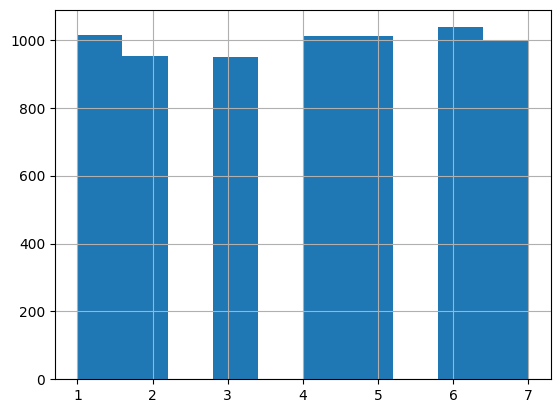

<Axes: >

MKT_UNIQUE_CARRIER


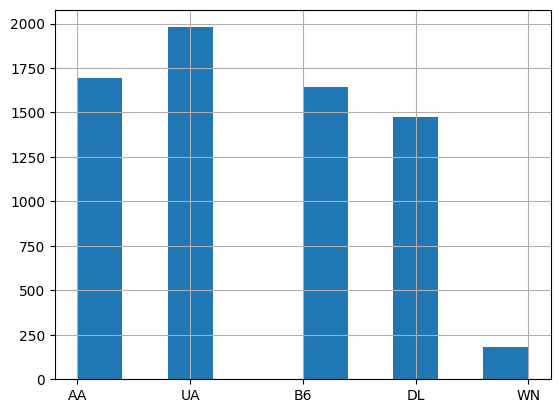

<Axes: >

OP_UNIQUE_CARRIER


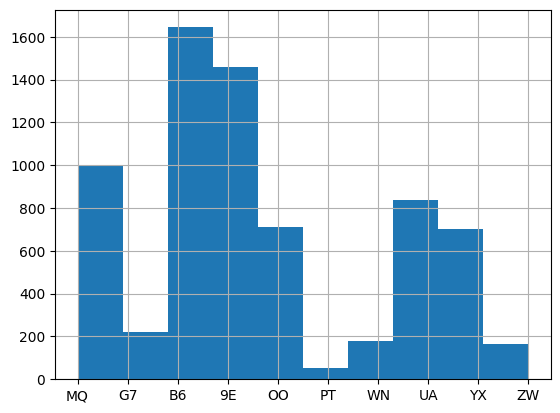

<Axes: >

OP_CARRIER_FL_NUM


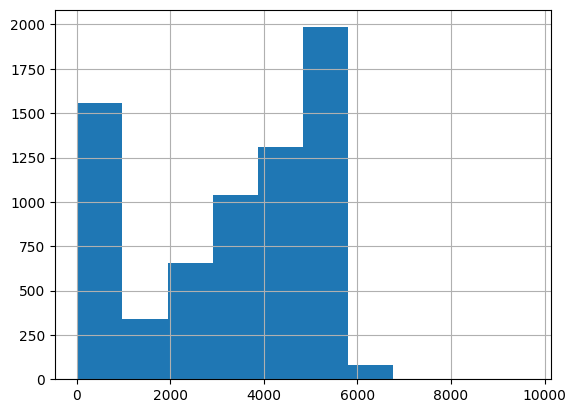

<Axes: >

ORIGIN


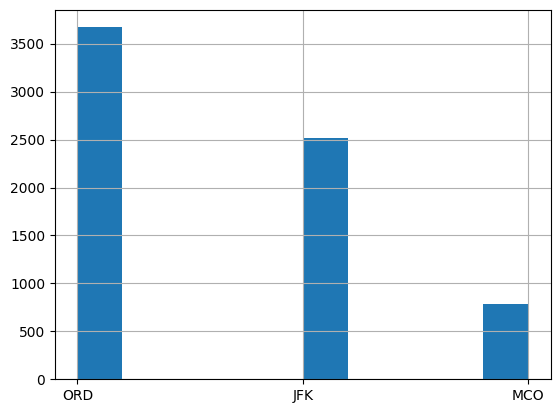

<Axes: >

DEST


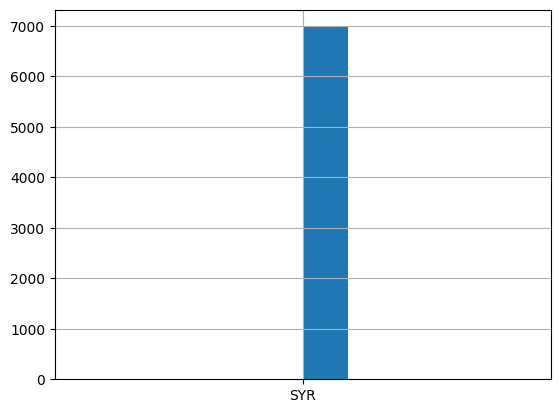

<Axes: >

ARR_TIME


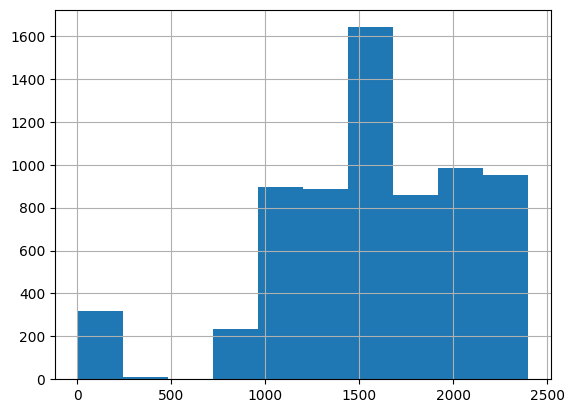

<Axes: >

ARR_DELAY


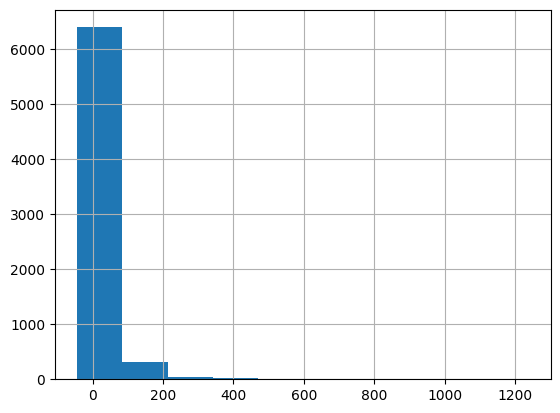

<Axes: >

CANCELLED


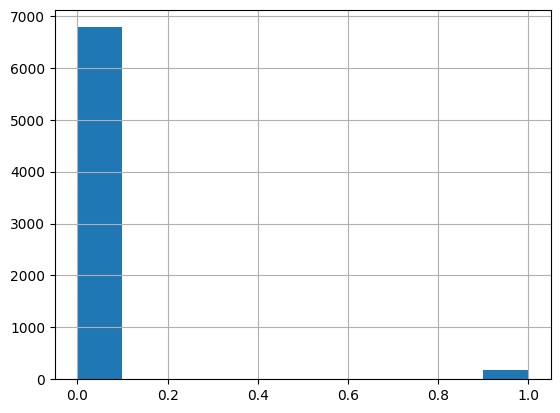

<Axes: >

DIVERTED


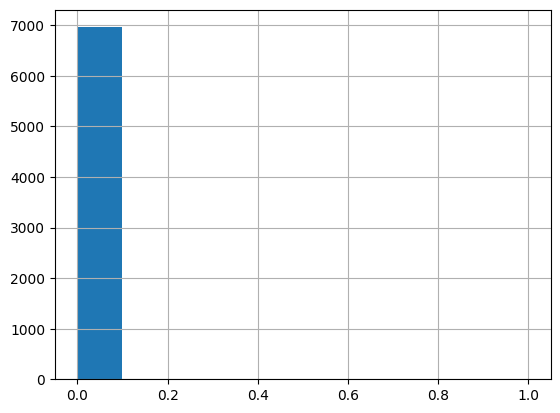

<Axes: >

DUP


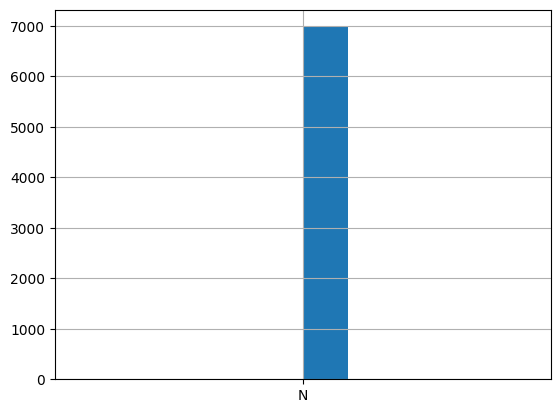

<Axes: >

DISTANCE


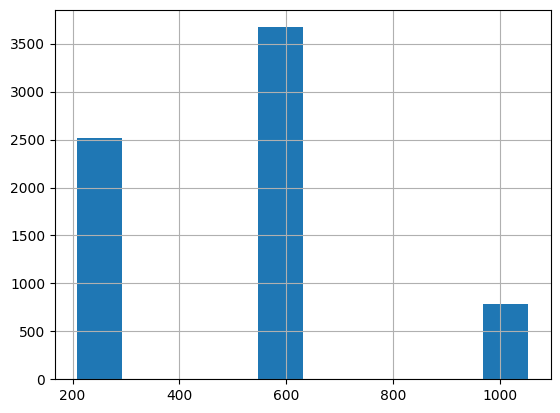

<Axes: >

WEATHER_DELAY


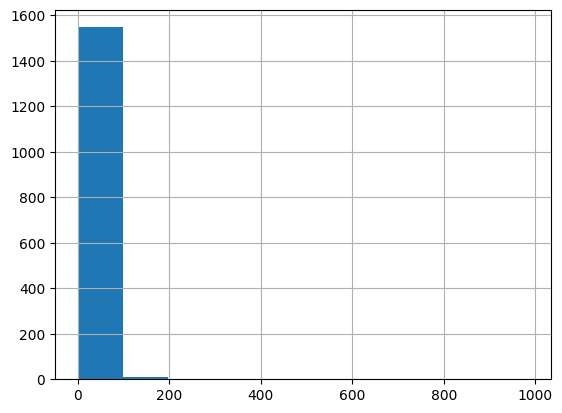

<Axes: >

NAS_DELAY


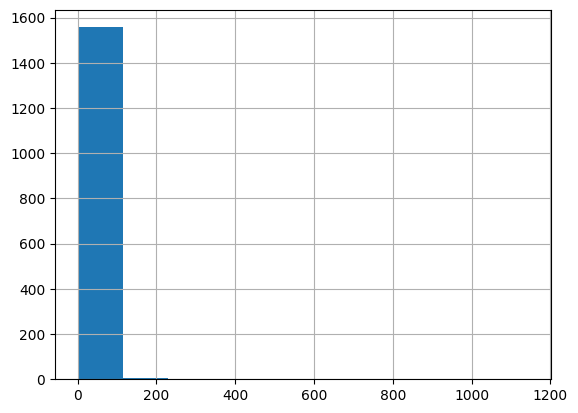

<Axes: >

LATE_AIRCRAFT_DELAY


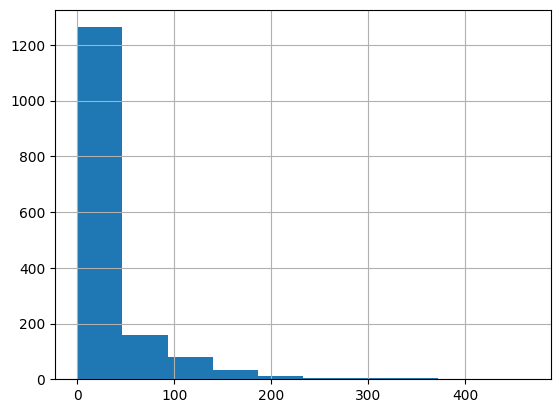

<Axes: >

DIV_AIRPORT_LANDINGS


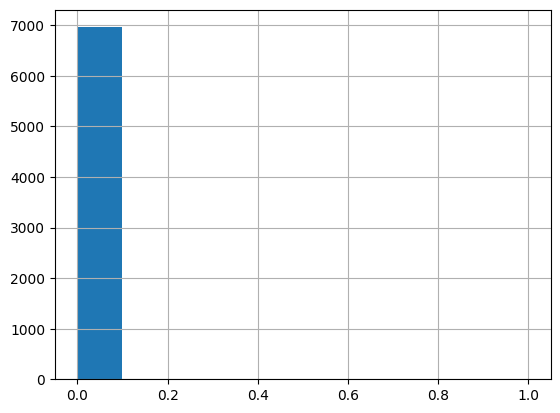

<Axes: >

CRS_ELAPSED_TIME


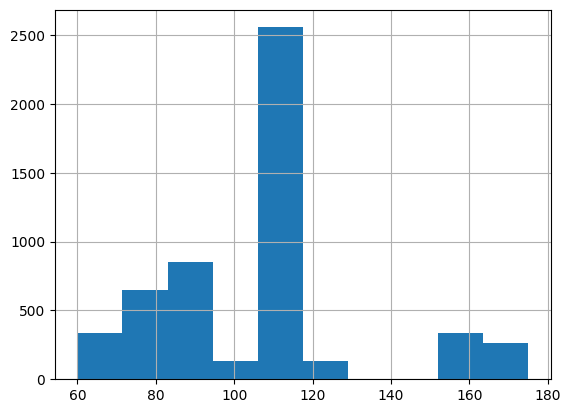

<Axes: >

SCH_DEP_TIME


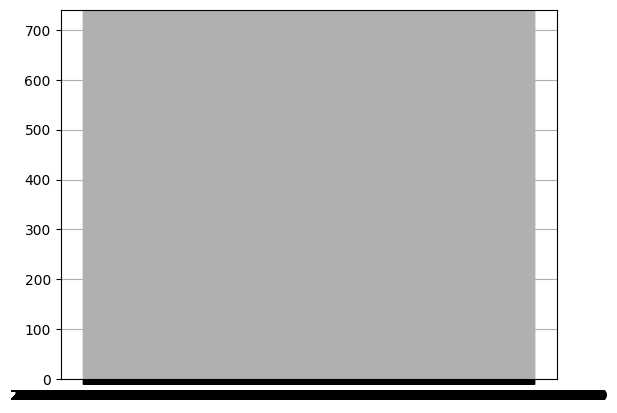

<Axes: >

SCH_ARR_TIME


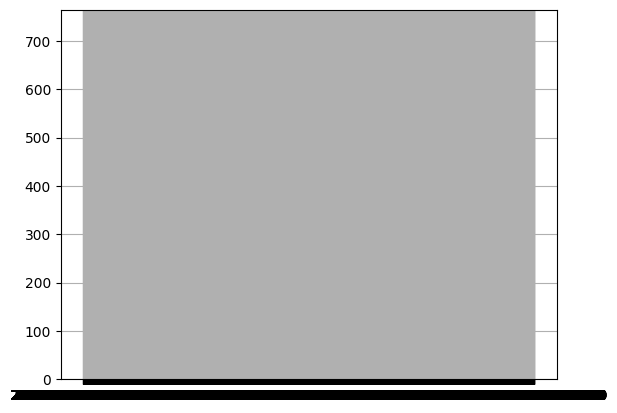

<Axes: >

ORGIN_WTH_temp


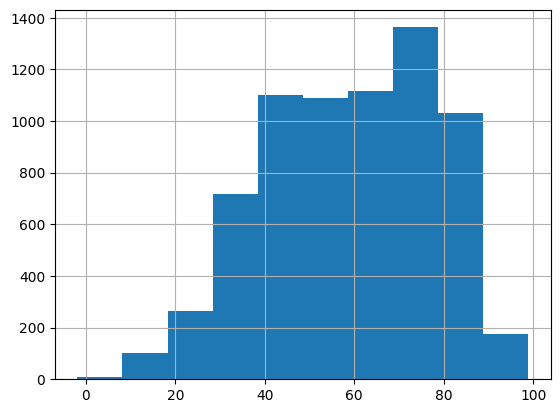

<Axes: >

ORGIN_WTH_feelslike


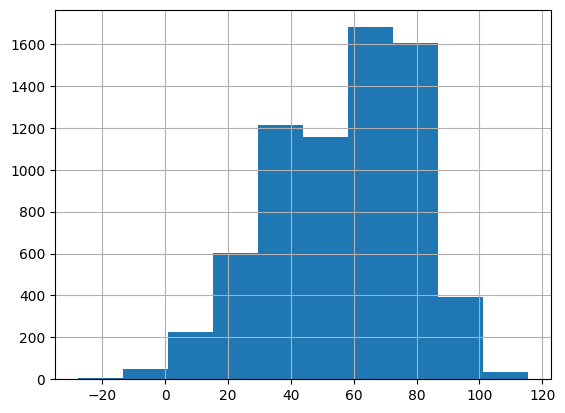

<Axes: >

ORGIN_WTH_precip


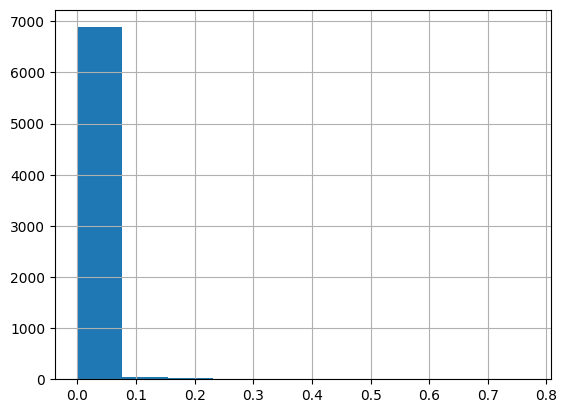

<Axes: >

ORGIN_WTH_precipprob


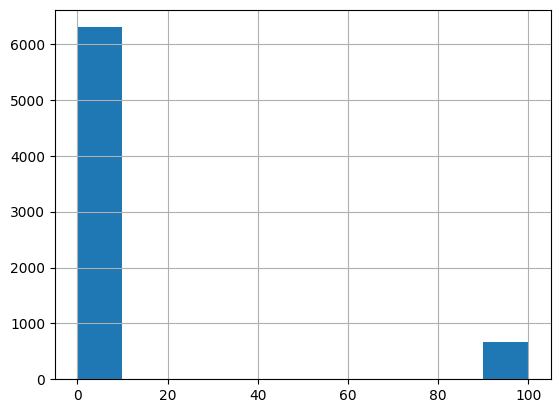

<Axes: >

ORGIN_WTH_preciptype


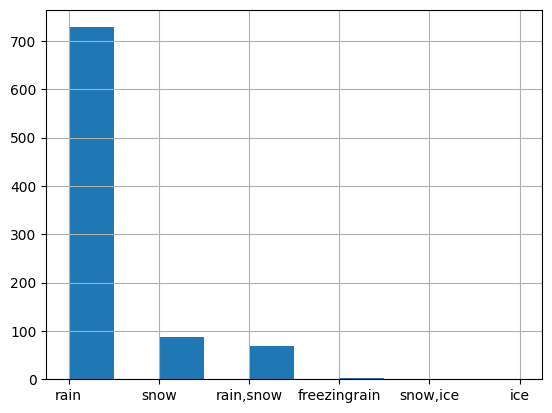

<Axes: >

ORGIN_WTH_snow


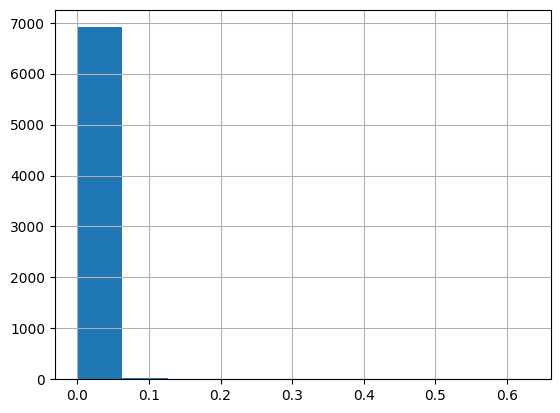

<Axes: >

ORGIN_WTH_windgust


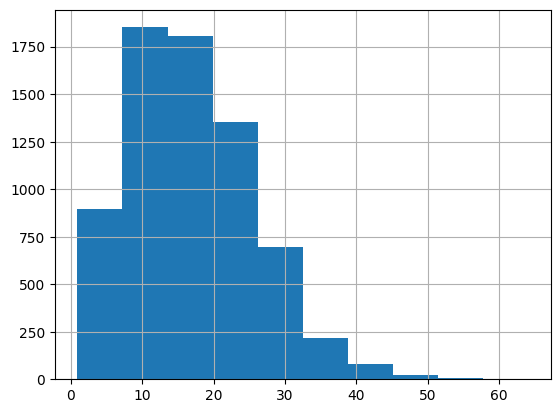

<Axes: >

ORGIN_WTH_windspeed


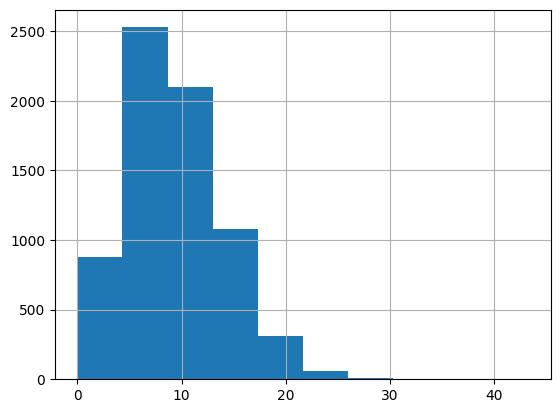

<Axes: >

ORGIN_WTH_winddir


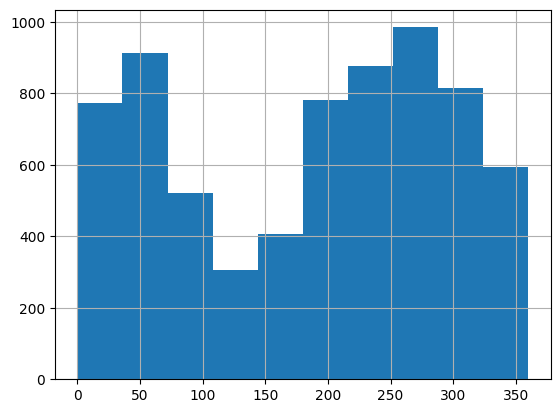

<Axes: >

ORGIN_WTH_cloudcover


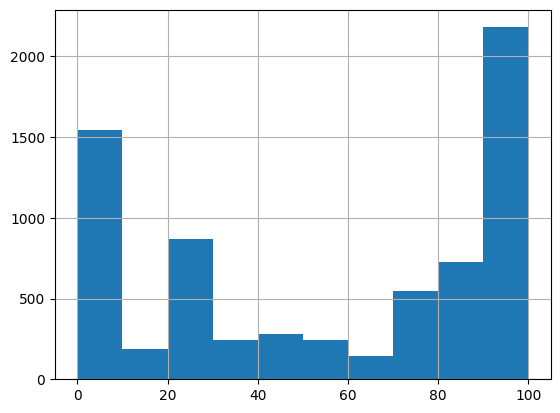

<Axes: >

ORGIN_WTH_visibility


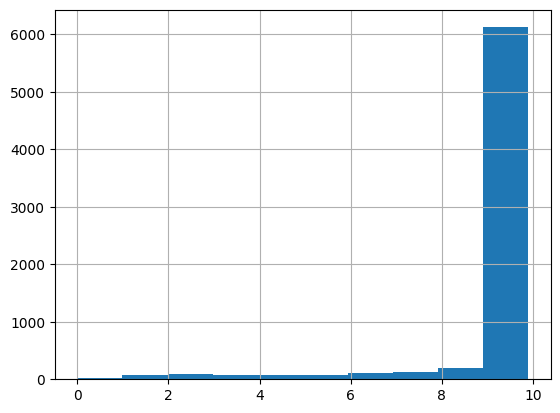

<Axes: >

ORGIN_WTH_severerisk


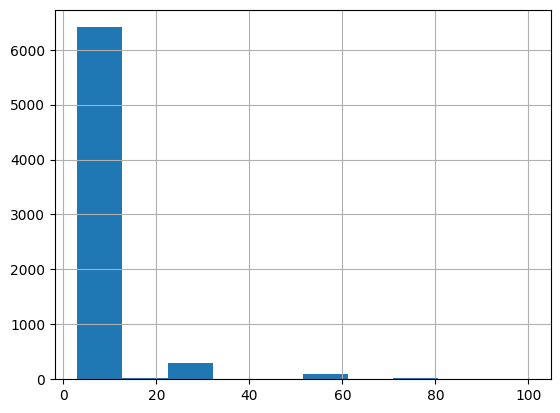

<Axes: >

ORGIN_WTH_conditions


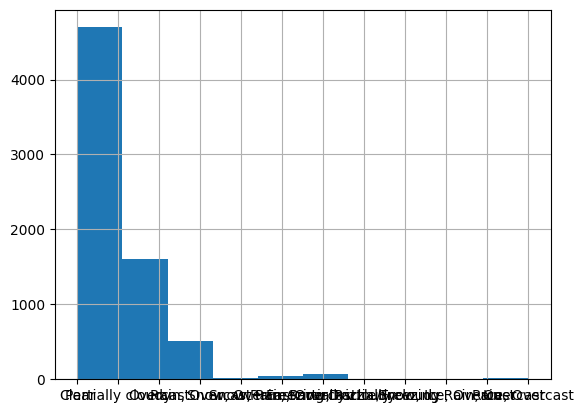

<Axes: >

DEST_WTH_temp


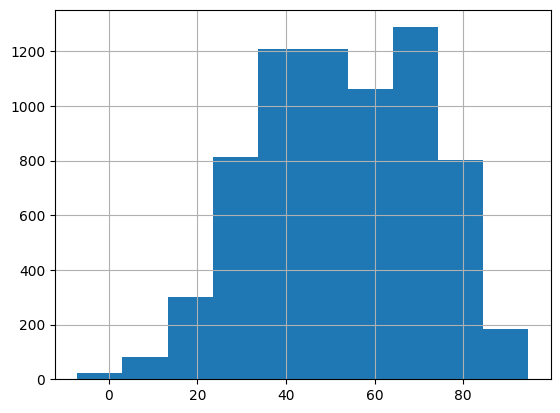

<Axes: >

DEST_WTH_feelslike


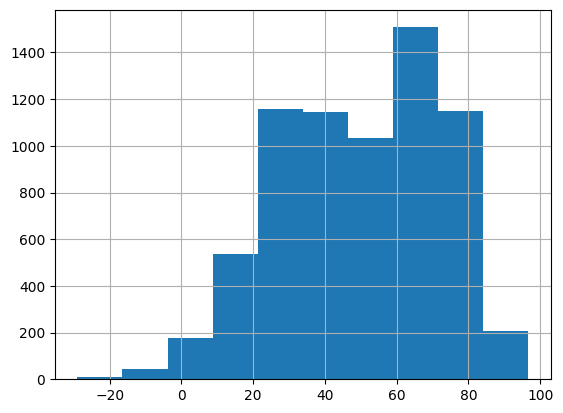

<Axes: >

DEST_WTH_precip


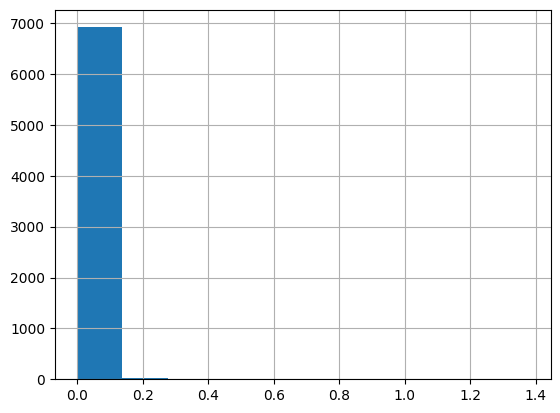

<Axes: >

DEST_WTH_precipprob


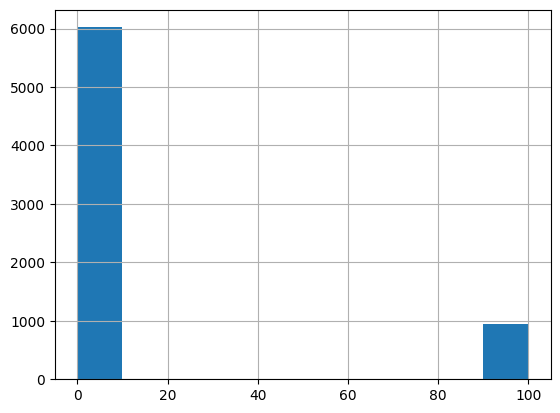

<Axes: >

DEST_WTH_preciptype


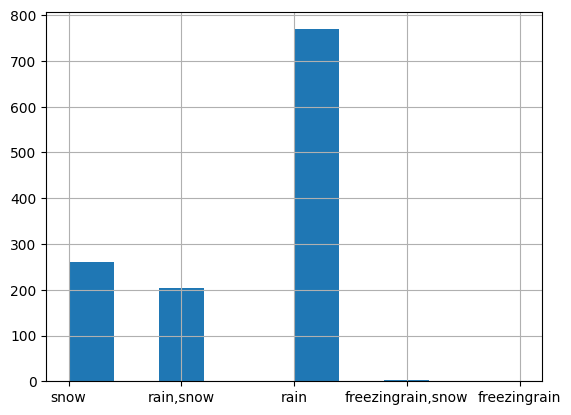

<Axes: >

DEST_WTH_snow


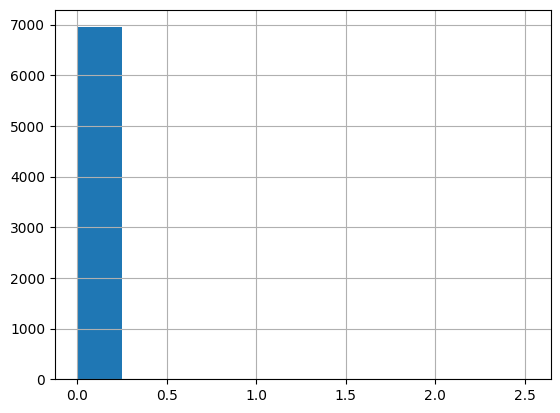

<Axes: >

DEST_WTH_windgust


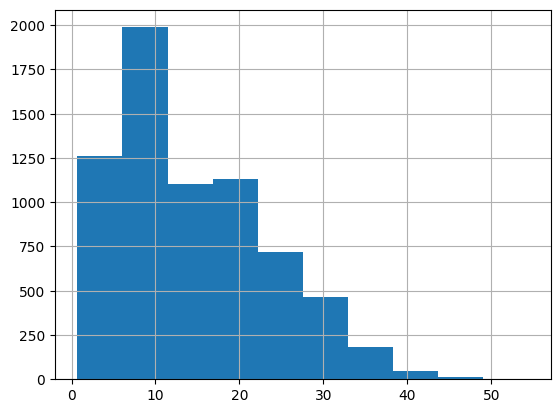

<Axes: >

DEST_WTH_windspeed


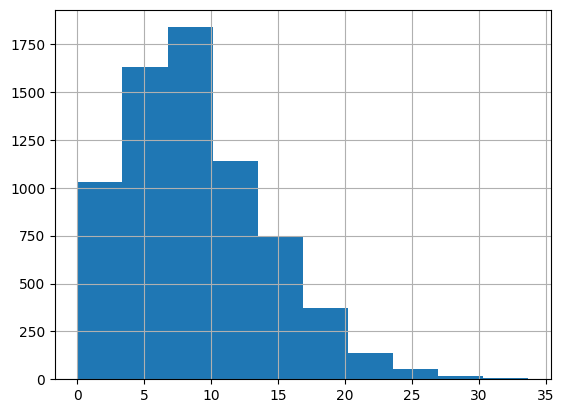

<Axes: >

DEST_WTH_winddir


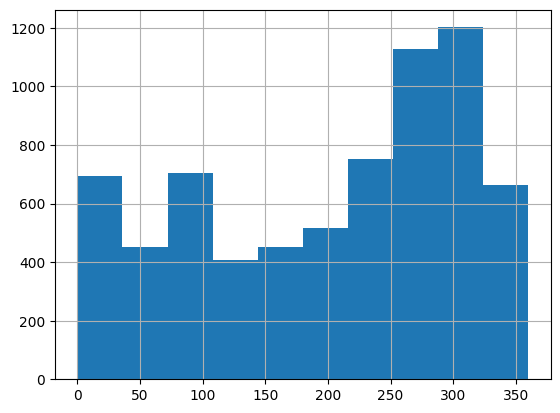

<Axes: >

DEST_WTH_cloudcover


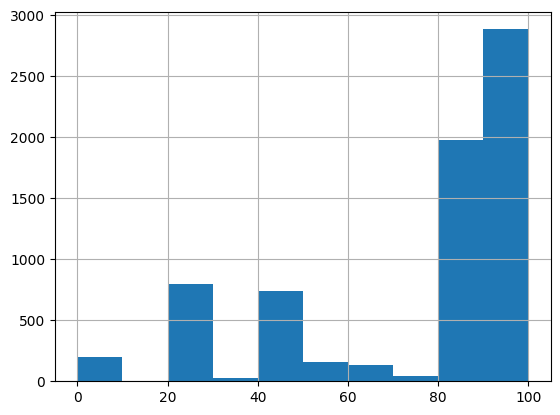

<Axes: >

DEST_WTH_visibility


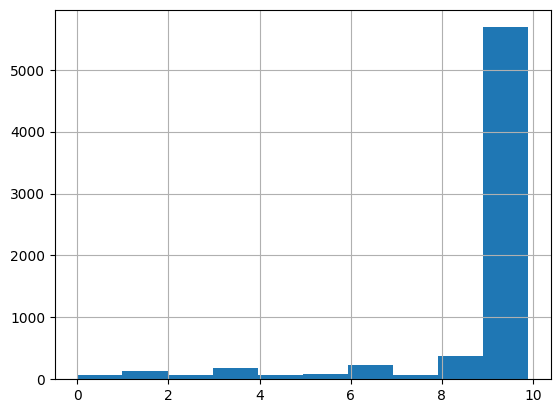

<Axes: >

DEST_WTH_severerisk


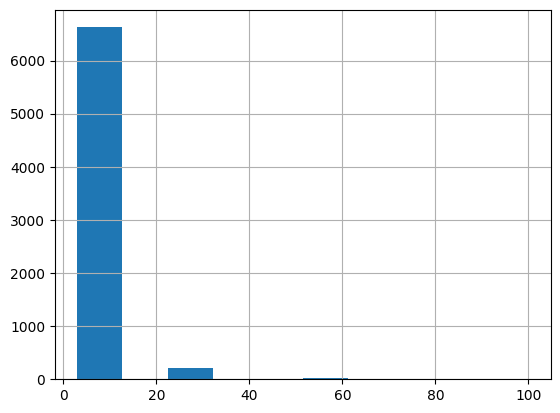

<Axes: >

DEST_WTH_conditions


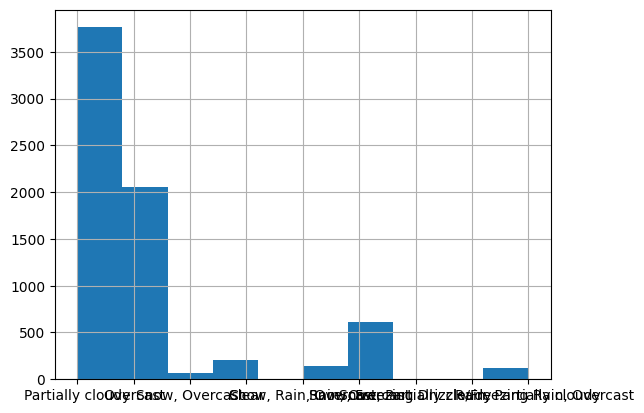

In [8]:
#Histogram
cols = flight_dataset.columns
print(cols)
for col in cols: 
    flight_dataset[col].hist()
    print(col)
    plt.show()

In [10]:
# define function to import viz libraries
import plotly
plotly.offline.init_notebook_mode(connected=True)
from plotly.graph_objs import *
from plotly import tools
import plotly.graph_objects as go
import seaborn as sns

In [11]:
# Function to visualize by features
def visualize_by_features(list_of_features, y_col):
    for x_col in list_of_features:
        plot_data = []
        df_plot = flight_dataset[[x_col, y_col]].sort_values(by=x_col)
        plot_data.append(go.Scatter(x= df_plot[x_col], y= df_plot[y_col], 
                         name = 'feature = {}'.format(x_col), mode = 'markers' ))

        layout = go.Layout(xaxis = dict(title=x_col), yaxis = dict(title= y_col), 
                           title = 'Data for {}'.format(y_col))
        fig = go.Figure(data= plot_data, layout=layout)
        plotly.offline.iplot(fig)

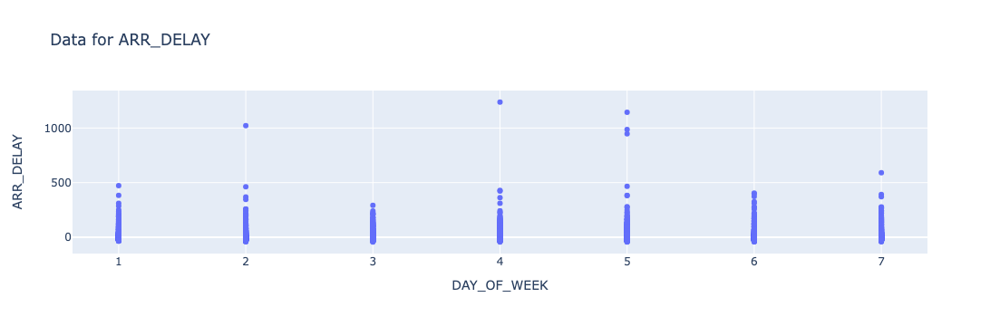

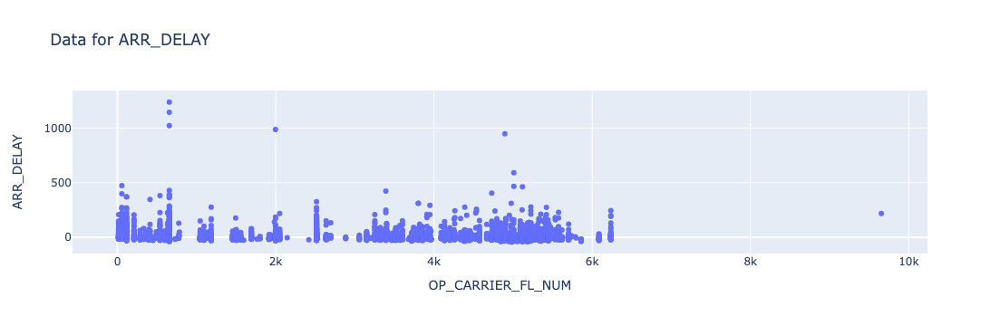

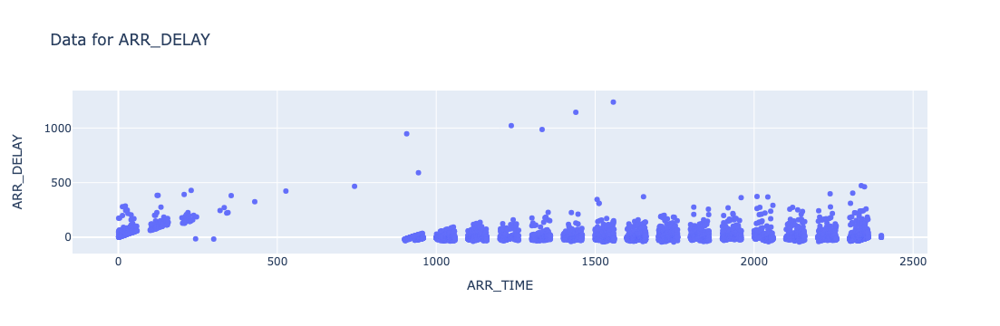

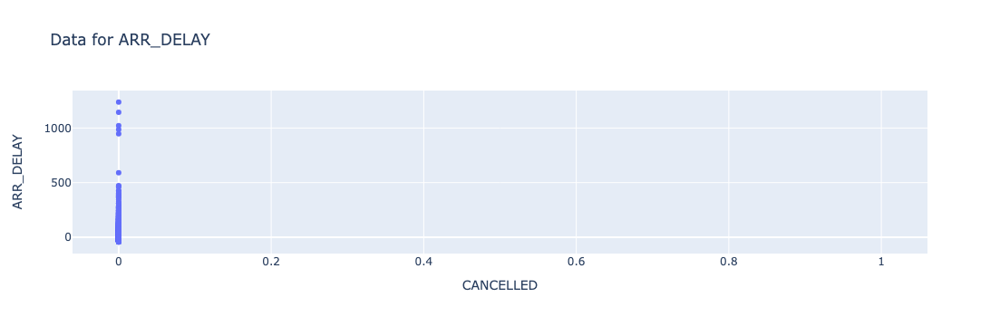

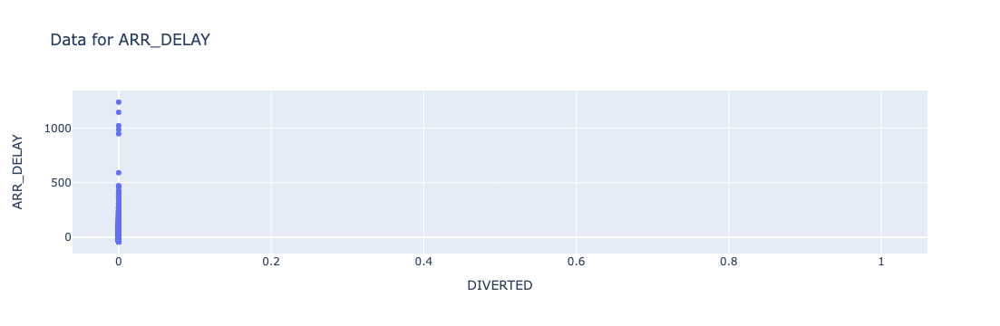

...

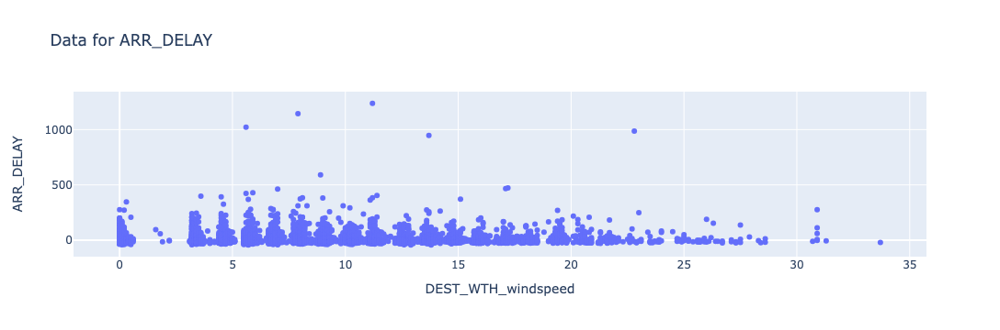

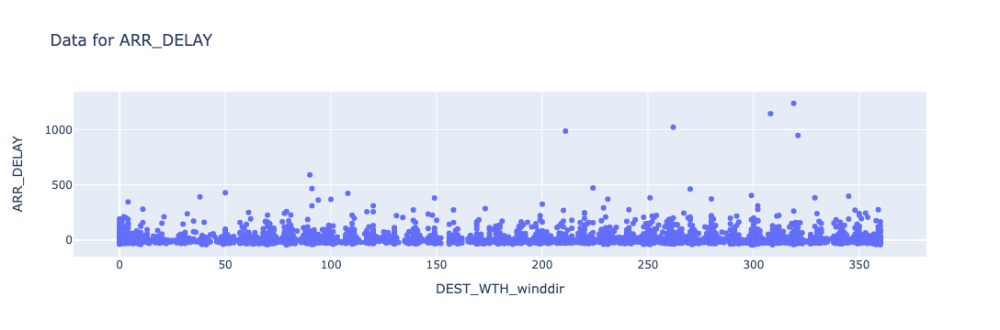

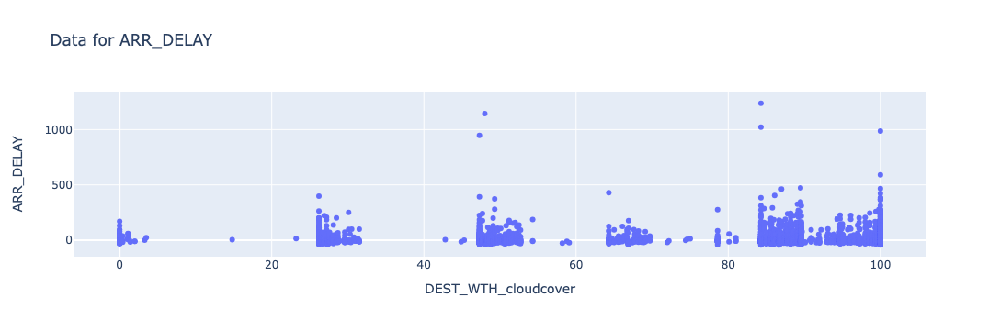

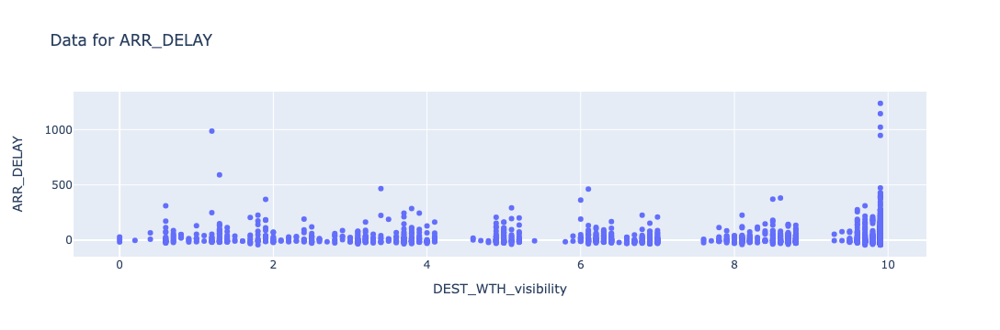

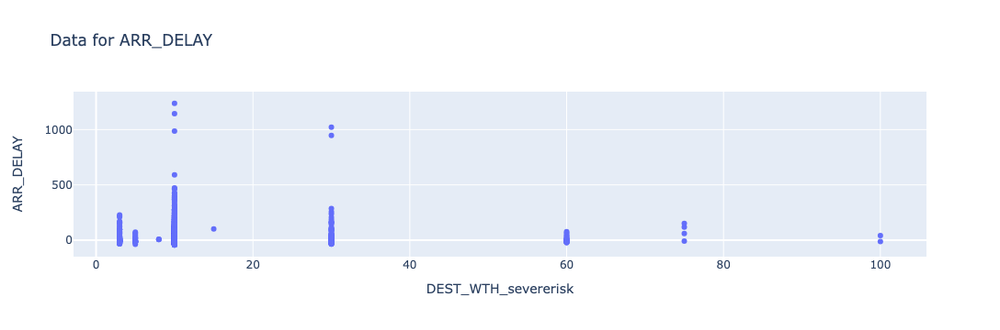

In [12]:
visualize_by_features(['DAY_OF_WEEK', 'OP_CARRIER_FL_NUM', 'ARR_TIME', 'CANCELLED', 'DIVERTED', 'DISTANCE', 'WEATHER_DELAY', 'NAS_DELAY', 'LATE_AIRCRAFT_DELAY', 'DIV_AIRPORT_LANDINGS', 'CRS_ELAPSED_TIME', 'ORGIN_WTH_temp', 'ORGIN_WTH_feelslike', 'ORGIN_WTH_precip', 'ORGIN_WTH_precipprob', 'ORGIN_WTH_snow', 'ORGIN_WTH_windgust', 'ORGIN_WTH_windspeed', 'ORGIN_WTH_winddir', 'ORGIN_WTH_cloudcover', 'ORGIN_WTH_visibility', 'ORGIN_WTH_severerisk', 'DEST_WTH_temp', 'DEST_WTH_feelslike', 'DEST_WTH_precip', 'DEST_WTH_precipprob', 'DEST_WTH_snow', 'DEST_WTH_windgust', 'DEST_WTH_windspeed', 'DEST_WTH_winddir', 'DEST_WTH_cloudcover', 'DEST_WTH_visibility', 'DEST_WTH_severerisk'],'ARR_DELAY')

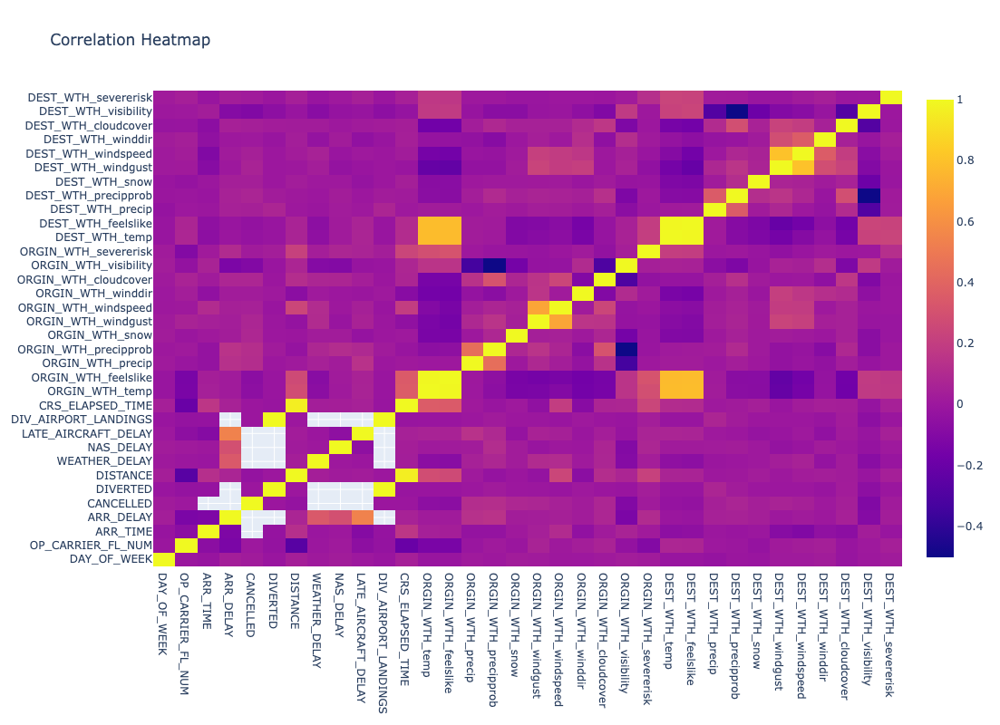

In [14]:
#Heatmap to find the feature with highest correlation with price

import plotly
plotly.offline.init_notebook_mode(connected=True)
from plotly.graph_objs import *
from plotly import tools
import plotly.graph_objects as go
import seaborn as sns
import plotly.offline as pyo

# Exclude non-numeric columns before calculating correlation
numeric_df = flight_dataset.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correl = numeric_df.corr()

# Create a heatmap trace
trace = go.Heatmap(z=correl.values,
                  x=correl.index.values,
                  y=correl.columns.values)

# Create a list of traces
data = [trace]

# Create layout
layout = go.Layout(title='Correlation Heatmap', height=800)

# Create figure
fig = go.Figure(data=data, layout=layout)

# Display the heatmap
pyo.iplot(fig)

In [15]:
# Get unique values for origin and airline
unique_origins = flight_dataset['ORIGIN'].unique()
unique_airlines = flight_dataset['MKT_UNIQUE_CARRIER'].unique()

# Iterate over all combinations of origin and airline
for origin in unique_origins:
    for airline in unique_airlines:
        # Filter the DataFrame based on the current origin and airline
        filtered_data = flight_dataset[(flight_dataset['ORIGIN'] == origin) & (flight_dataset['MKT_UNIQUE_CARRIER'] == airline)]
        
        # Calculate the average ARR_DELAY
        average_arr_delay = filtered_data['ARR_DELAY'].mean()
        
        # Print the result
        print(f"The average ARR_DELAY for flights from {origin} with airline {airline} is: {average_arr_delay}")


The average ARR_DELAY for flights from ORD with airline AA is: 6.04603270745003
The average ARR_DELAY for flights from ORD with airline UA is: 6.992757371960683
The average ARR_DELAY for flights from ORD with airline B6 is: nan
The average ARR_DELAY for flights from ORD with airline DL is: nan
The average ARR_DELAY for flights from ORD with airline WN is: nan
The average ARR_DELAY for flights from JFK with airline AA is: nan
The average ARR_DELAY for flights from JFK with airline UA is: nan
The average ARR_DELAY for flights from JFK with airline B6 is: 22.067201604814443
The average ARR_DELAY for flights from JFK with airline DL is: -0.04338698390482855
The average ARR_DELAY for flights from JFK with airline WN is: nan
The average ARR_DELAY for flights from MCO with airline AA is: nan
The average ARR_DELAY for flights from MCO with airline UA is: nan
The average ARR_DELAY for flights from MCO with airline B6 is: 34.483760683760686
The average ARR_DELAY for flights from MCO with airline

<Axes: xlabel='ORIGIN'>

Text(0.5, 1.0, 'Average ARR_DELAY by Origin and Airline')

Text(0.5, 0, 'Origin')

Text(0, 0.5, 'Average ARR_DELAY')

(array([0, 1, 2]), [Text(0, 0, 'JFK'), Text(1, 0, 'MCO'), Text(2, 0, 'ORD')])

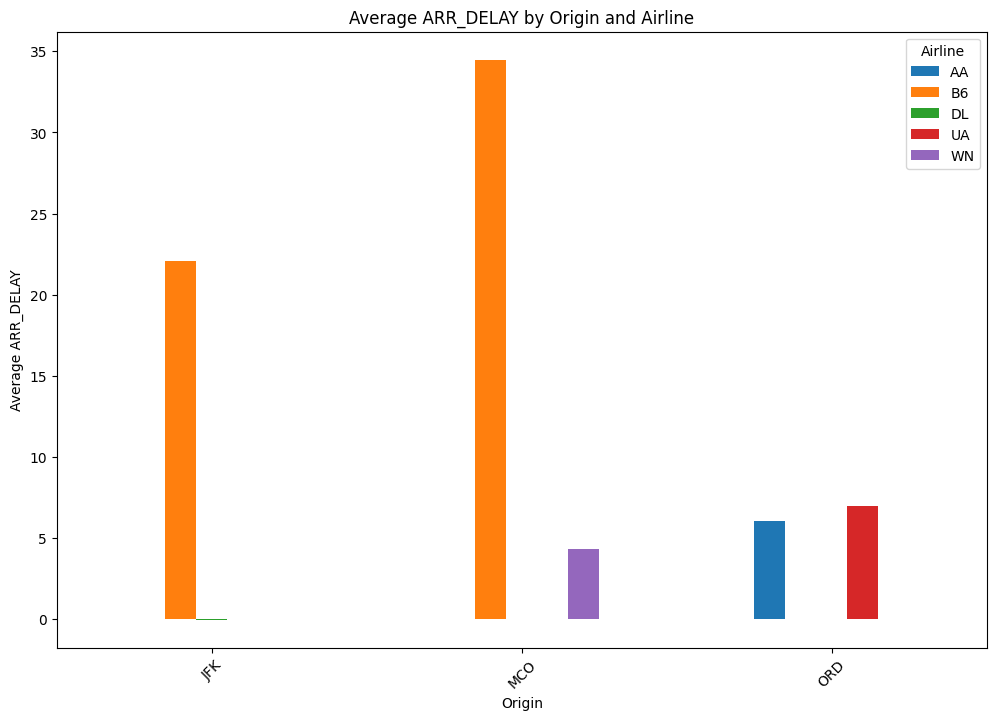

In [16]:
import matplotlib.pyplot as plt

# Group the data by origin and airline, then calculate average ARR_DELAY
grouped_data = flight_dataset.groupby(['ORIGIN', 'MKT_UNIQUE_CARRIER'])['ARR_DELAY'].mean().unstack()

# Create the clustered bar chart
grouped_data.plot(kind='bar', figsize=(12, 8))
plt.title('Average ARR_DELAY by Origin and Airline')
plt.xlabel('Origin')
plt.ylabel('Average ARR_DELAY')
plt.xticks(rotation=45)
plt.legend(title='Airline')
plt.show()


In [17]:
# Group the data by origin and calculate the average ARR_DELAY for each origin
average_delay_by_origin = flight_dataset.groupby('ORIGIN')['ARR_DELAY'].mean()

# Print the result
print("Average delay from each origin for all airlines:")
print(average_delay_by_origin)


Average delay from each origin for all airlines:
ORIGIN
JFK    9.04
MCO   27.44
ORD    6.56
Name: ARR_DELAY, dtype: float64


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='ORIGIN'>

Text(0.5, 1.0, 'Average Delay from Each Origin for All Airlines')

Text(0.5, 0, 'Origin')

Text(0, 0.5, 'Average Delay')

(array([0, 1, 2]), [Text(0, 0, 'JFK'), Text(1, 0, 'MCO'), Text(2, 0, 'ORD')])

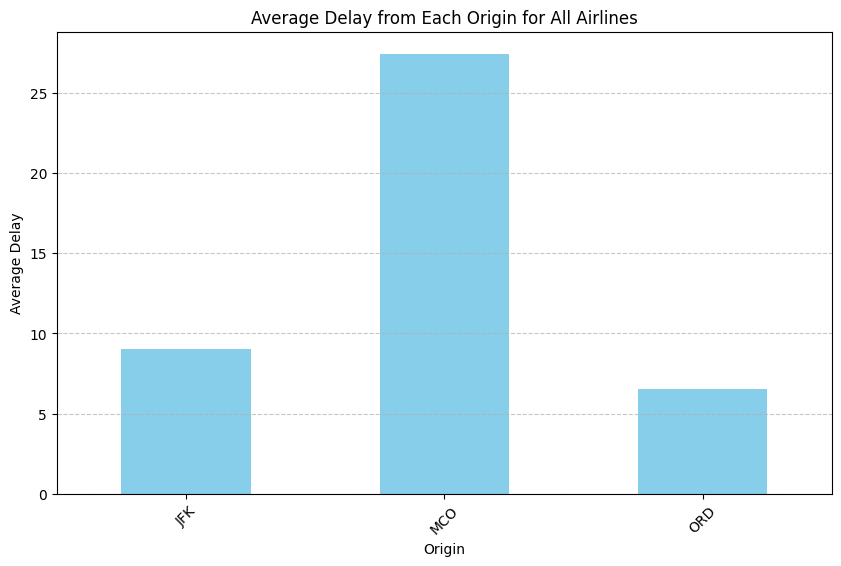

In [18]:
import matplotlib.pyplot as plt

# Group the data by origin and calculate the average ARR_DELAY for each origin
average_delay_by_origin = flight_dataset.groupby('ORIGIN')['ARR_DELAY'].mean()

# Create a clustered bar chart
plt.figure(figsize=(10, 6))
average_delay_by_origin.plot(kind='bar', color='skyblue')
plt.title('Average Delay from Each Origin for All Airlines')
plt.xlabel('Origin')
plt.ylabel('Average Delay')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [20]:
flight_dataset.head()

,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,OP_UNIQUE_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,ARR_TIME,ARR_DELAY,CANCELLED,DIVERTED,...,DEST_WTH_precipprob,DEST_WTH_preciptype,DEST_WTH_snow,DEST_WTH_windgust,DEST_WTH_windspeed,DEST_WTH_winddir,DEST_WTH_cloudcover,DEST_WTH_visibility,DEST_WTH_severerisk,DEST_WTH_conditions
0,1,AA,MQ,4134,ORD,SYR,"1,257.00",-19.00,0,0,...,0,NaN,0.00,NaN,6.90,309.00,84.30,9.90,NaN,Partially cloudy
1,1,AA,MQ,4253,ORD,SYR,"2,024.00",12.00,0,0,...,0,NaN,0.00,NaN,5.80,335.00,29.60,9.90,NaN,Partially cloudy
2,1,AA,MQ,4316,ORD,SYR,"1,813.00",-2.00,0,0,...,0,NaN,0.00,NaN,5.70,292.00,47.30,9.90,NaN,Partially cloudy
3,1,UA,G7,4576,ORD,SYR,"1,722.00",-14.00,0,0,...,0,NaN,0.00,NaN,5.70,292.00,47.30,9.90,NaN,Partially cloudy
4,1,B6,B6,116,JFK,SYR,NaN,NaN,1,0,...,0,NaN,0.00,NaN,6.80,301.00,84.30,9.90,NaN,Partially cloudy


In [22]:
filtered_flight_dataset = flight_dataset[['DAY_OF_WEEK', 'MKT_UNIQUE_CARRIER', 'OP_UNIQUE_CARRIER', 'ORIGIN',
       'ARR_DELAY', 'SCH_DEP_TIME', 'SCH_ARR_TIME', 'ORGIN_WTH_temp',
       'ORGIN_WTH_precip', 'ORGIN_WTH_precipprob', 'ORGIN_WTH_snow',
       'ORGIN_WTH_windspeed', 'ORGIN_WTH_winddir', 'ORGIN_WTH_cloudcover',
       'ORGIN_WTH_visibility', 'ORGIN_WTH_severerisk', 'DEST_WTH_temp',
       'DEST_WTH_precip', 'DEST_WTH_precipprob', 'DEST_WTH_snow',
       'DEST_WTH_windspeed', 'DEST_WTH_winddir', 'DEST_WTH_cloudcover',
       'DEST_WTH_visibility', 'DEST_WTH_severerisk']]
filtered_flight_dataset.head()

,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,OP_UNIQUE_CARRIER,ORIGIN,ARR_DELAY,SCH_DEP_TIME,SCH_ARR_TIME,ORGIN_WTH_temp,ORGIN_WTH_precip,ORGIN_WTH_precipprob,...,ORGIN_WTH_severerisk,DEST_WTH_temp,DEST_WTH_precip,DEST_WTH_precipprob,DEST_WTH_snow,DEST_WTH_windspeed,DEST_WTH_winddir,DEST_WTH_cloudcover,DEST_WTH_visibility,DEST_WTH_severerisk
0,1,AA,MQ,ORD,-19.00,2022-01-03 10:25:00,2022-01-03 13:16:00,14.10,0.00,0,...,NaN,17.80,0.00,0,0.00,6.90,309.00,84.30,9.90,NaN
1,1,AA,MQ,ORD,12.00,2022-01-03 17:25:00,2022-01-03 20:12:00,20.10,0.00,0,...,NaN,12.70,0.00,0,0.00,5.80,335.00,29.60,9.90,NaN
2,1,AA,MQ,ORD,-2.00,2022-01-03 15:28:00,2022-01-03 18:15:00,22.70,0.00,0,...,NaN,15.00,0.00,0,0.00,5.70,292.00,47.30,9.90,NaN
3,1,UA,G7,ORD,-14.00,2022-01-03 14:45:00,2022-01-03 17:36:00,22.70,0.00,0,...,NaN,15.00,0.00,0,0.00,5.70,292.00,47.30,9.90,NaN
4,1,B6,B6,JFK,NaN,2022-01-03 08:29:00,2022-01-03 09:50:00,31.10,0.00,0,...,NaN,14.90,0.00,0,0.00,6.80,301.00,84.30,9.90,NaN


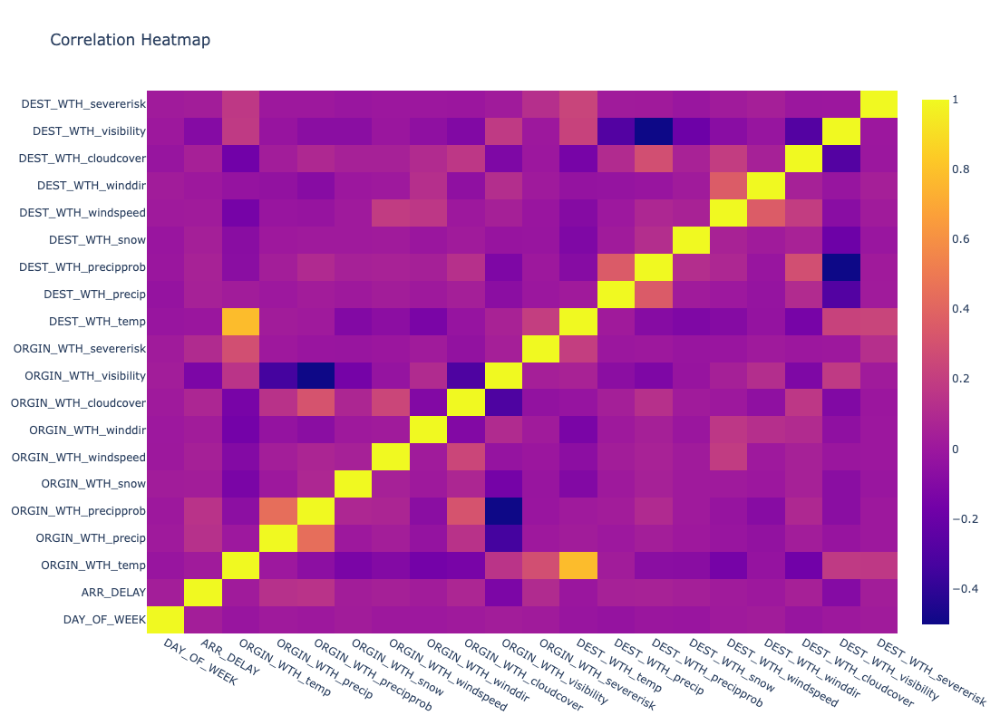

In [23]:
#Heatmap to find the feature with highest correlation with price

import plotly
plotly.offline.init_notebook_mode(connected=True)
from plotly.graph_objs import *
from plotly import tools
import plotly.graph_objects as go
import seaborn as sns
import plotly.offline as pyo

# Exclude non-numeric columns before calculating correlation
numeric_df = filtered_flight_dataset.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correl = numeric_df.corr()

# Create a heatmap trace
trace = go.Heatmap(z=correl.values,
                  x=correl.index.values,
                  y=correl.columns.values)

# Create a list of traces
data = [trace]

# Create layout
layout = go.Layout(title='Correlation Heatmap', height=800)

# Create figure
fig = go.Figure(data=data, layout=layout)

# Display the heatmap
pyo.iplot(fig)